<a href="https://colab.research.google.com/github/Alyssonmach/pdi-labs/blob/main/lab8-pt1-transferencia-de-aprendizado.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<img src="https://www.anped.org.br/sites/default/files/images/ufcg-lateral.png" width="780" height="240" align="center"/>

## Centro de Engenharia Elétrica e Informática
## Departamento de Engenharia Elétrica
## Disciplina: <span style="color:red">Int. ao Processamento de Imagem Digital e Visão Computacional</span>
## Professora: <span style="color:red">Luciana Veloso</span>

# <span style="color:red">Laboratório 8.1: Transferência de Aprendizado</span>
***

### Importação dos Pacotes

In [ ]:
import os                                # operational system para manipulação de arquivos.
import cv2                               # opencv para manipulação de imagens.
import random
import numpy as np                       # numpy para manipulação de matrizes e arrays
import matplotlib.pyplot as plt          # pyplot para plotagem de gráficos e imagens
import zipfile                           # zipfile para lidar com arquivos compactados
import urllib.request as url             # urllib para baixar arquivos via HTTPS
from tensorflow.keras import layers      # módulo de camadas do keras
from tensorflow.keras import callbacks   # módulo de callbacks do keras
from tensorflow.keras import optimizers  # módulo de otimizadores do keras
# classe de modelos sequenciais para construir as redes neurais
from tensorflow.keras.models import Sequential   
# classe de modelos sequenciais para construir as redes neurais
from tensorflow.keras.applications import VGG16  

# gerador de dados do keras, utilizado para carregar imagens em tempo de execução
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [ ]:
# extraindo a base de dados do arquivo compactado
url.urlretrieve('https://github.com/Alyssonmach/pdi-labs/raw/main/data.zip', 
                'data.zip')
with zipfile.ZipFile('data.zip', 'r') as zip_ref:
    zip_ref.extractall('')

### Dados do Experimento

* Vamos utilizar o banco de dados Cats vs Dogs, que foi utilizado no Desafio Prático;

* Cada instância do banco de dados corresponde a uma imagem rotulada de um Cachorro ou um Gato;

* As imagens do banco de dados são coloridas e foram redimensionadas para 150x150;

* Imagens de Cachorro têm rótulo 0 e as de Gato têm rótulo 1;

* A versão que estamos usando tem 3000 imagens, 2000 para treino, 500 para validação e 500 para teste;

* Todas as partições da base de dados são balanceadas;

### Carrregando os Dados em Tempo Real

O Keras disponibiliza um objeto ImageDataGenerator para o carregamento de dados em tempo real durante o treinamento de modelos. São necessárias duas etapas para configurar o objeto:

1. Definição das transformações realizadas sobre os dados, ao instanciar o ImageDataGenerator propriamente dito:
    * Isso pode ser feito a partir de **datagen = ImageDataGenerator( rescale = 1./255 )**
    * Nesse exemplo o único parâmetro setado é o rescale, que define uma constante para normalizar as imagens carregadas.
    * Outras transformações podem ser especificadas utilizando outros parâmetros;
2. Definição do método de carregamento:
    * Os dados podem ser carregados com base em uma estrutura de diretórios ou a partir de um dataframe;
    * Vamos utilizar o método **flow_from_directory** para carregar os dados com base na estrutura de dados montada;
    * A chamada do método se faz a partir de **generator = datagen.flow_from_directory( data_dir, target_size, batch_size, class_mode)**
        * generator é um objeto de fornece exemplos continuamente a não ser que seja explicitamente encerrado ( while(True) );
        * data_dir é o diretório raiz dos dados, dentro dessa pasta os exemplos devem estar divididos por classe em pastas distintas;
        * target_size é uma tupla que especifica o tamanho das imagens carregadas;
        * class_mode define como os gabaritos são carregados, se **"binary"** carrega os gabaritos como inteiros 0 ou 1, se **"categorical"** carrega gabaritos categóricas conforme usadas no Exp. 7, se **None** não carrega gabaritos;

In [ ]:
val_datagen   = ImageDataGenerator(rescale = 1. / 255)
val_generator = val_datagen.flow_from_directory(os.path.join(".", "data", "val"), 
                                                target_size = (150, 150),
                                                batch_size = 20, class_mode  = "binary")

# atributo do generator que fornece o número de amostras detectadas
val_samples = val_generator.samples 
print(val_samples, "amostras detectadas")

# atributo do generator que fornece o mapeamento de classe para índice 
# repare que os índices são definidos pelo generator com base nos diretórios 
# de arquivos em ordem alfabética
class_to_idx_dict = val_generator.class_indices
print("Mapeamento Classes -> Índices:", class_to_idx_dict)

# construção de um novo dicionário que inverte o mapeamento
idx_to_class_dict = {v: k for k, v in class_to_idx_dict.items()}
print("Mapeamento Índices -> Classes:", idx_to_class_dict)

Found 1000 images belonging to 2 classes.
1000 amostras detectadas
Mapeamento Classes -> Índices: {'Cachorro': 0, 'Gato': 1}
Mapeamento Índices -> Classes: {0: 'Cachorro', 1: 'Gato'}


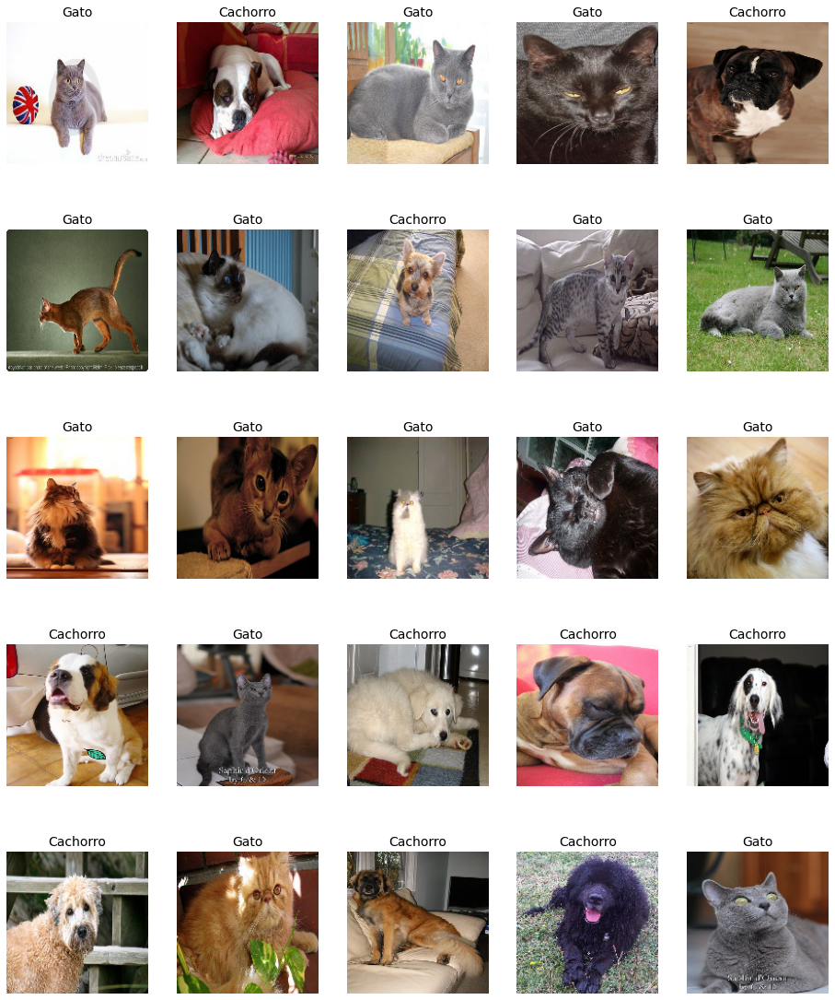

In [ ]:
n_rows = 5
n_cols = 5
fig, axs = plt.subplots(nrows=n_rows, ncols = n_cols, figsize = (16, 20))

i = 0
for batch in val_generator:
    inputs, outputs = batch

    for j in range(n_cols):
        imagem = inputs[j]
        classe = outputs[j]
        
        axs[i][j].imshow(imagem, vmin = 0, vmax = 1)
        axs[i][j].set_title(idx_to_class_dict[classe], size = 14)
        axs[i][j].axis('off')
    
    i += 1
    if i == n_rows:
        break

In [ ]:
x_images, y_labels = val_generator[0]
print('Quantidade de Imagens por Lote: {} Imagens'.format(x_images.shape[0]))
print('Dimensão das Imagens Fornecidas pelo Generator: {}\n--'.format(x_images.shape[1:]))
print('Quantidade de Rótulos por Lote: {} Rótulos'.format(y_labels.shape[0]))
print('Dimensão das Imagens Fornecidas pelo Generator: {}'.format(y_labels.shape))

Quantidade de Imagens por Lote: 20 Imagens
Dimensão das Imagens Fornecidas pelo Generator: (150, 150, 3)
--
Quantidade de Rótulos por Lote: 20 Rótulos
Dimensão das Imagens Fornecidas pelo Generator: (20,)


* As dimensões dos dados retornada pelo Generator é no formato de (**n**, **h**, **w**, **c**), em que **n** é o número de imagens retornadas por lote (20 imagens), **h** é a dimensão da altura da imagem (150 pixels), **w** é a dimensão do comprimento da imagem (150 pixels) e **c** é o número de canais.
* É comum que os geradores de imagens do Keras retornem dois tipos de dados a cada lote gerado. A primeira é relativa as imagens (20, 150, 150, 3) e a segunda é relativa as rotulações dos dados (20,). Desse modo, é possível separar  os exemplos do banco de dados dos seus respectivos gabaritos.
* Caso não fosse utilizado o 'break', os geradores retornariam lotes sem fim de parada.

### Aumento de Dados

Outras transformações possíveis no ImageDataGenerator viabilizam o aumento de dados. Nesse sentido, é possível definir transformações aleatórias que são realizadas conforme os dados são carregados para simular um banco de dados maior.

* Exemplos de transformações aleatórias são:
    * rotation_range valor que define o valor máximo (em graus) das rotações aleatórias realizadas;
    * width_shift_range valor (em fração) que determina o valor máximo de uma translação horizontal realizada com base na largura da imagem;
    * height_shift_range valor (em fração) que determina o valor máximo de uma translação vertical realizada com base na altura da imagem;
    * zoom_range valor (em fração) que determina o maior zoom aleatório realizado na imagem;
    * shear_range valor (em fração) que determina a maior deformação aleatória realizada na imagem;
    * horizontal_flip booleano que determina se reflexões horizontais devem ser aplicadas aleatoriamente na imagem;
    * vertical_flip booleano que determina se reflexões verticais devem ser aplicadas aleatoriamente na imagem;
    * fill_mode modo de preenchimento de buracos provocados pelas transformações realizadas:
        * 'constant': kkkkkkkk|abcd|kkkkkkkk (cval=k)
        * 'nearest': aaaaaaaa|abcd|dddddddd
        * 'reflect': abcddcba|abcd|dcbaabcd
        * 'wrap': abcdabcd|abcd|abcdabcd

In [ ]:
train_datagen = ImageDataGenerator(
    rescale = 1. / 255,       # normalizando as imagens    
    rotation_range = 45,      # rotação aleatória de até 40°
    width_shift_range = 0.2,  # translação horizontal de até 20% da largura
    height_shift_range = 0.2, # translação vertical de até 20% da altura
    zoom_range = 0.2,         # zoom aleatório de até 20%
    shear_range = 0.2,        # deformação de 20%
    horizontal_flip = True,   # espelhamento horizontal aleatório
    vertical_flip = False,    # espelhamento vertical aleatório
    fill_mode = "nearest")    # preenchimento de buracos pelo pixel mais próximo

train_generator = train_datagen.flow_from_directory(
                    os.path.join(".", "data", "train"), 
                    target_size = (150, 150),
                    batch_size  = 20, class_mode  = "binary")

# atributo do generator que fornece o número de amostras detectadas
train_samples = train_generator.samples 
print(train_samples)

Found 2000 images belonging to 2 classes.
2000


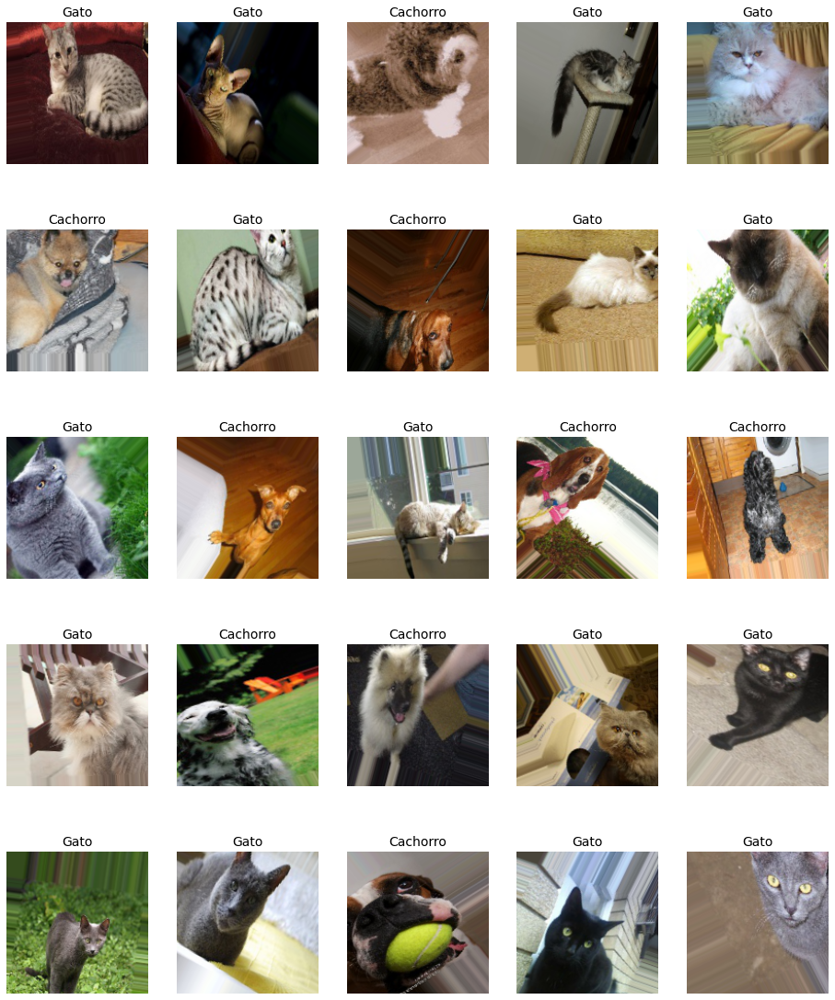

In [ ]:
n_rows = 5
n_cols = 5
fig, axs = plt.subplots(nrows = n_rows, ncols = n_cols, figsize = (16, 20))

i = 0
for batch in train_generator:
    inputs, outputs = batch

    for j in range(n_cols):
        imagem = inputs[j]
        classe = outputs[j]
        
        axs[i][j].imshow(imagem, vmin = 0, vmax = 1)
        axs[i][j].set_title(idx_to_class_dict[classe], size = 14)
        axs[i][j].axis('off')
    
    i += 1
    if i == n_rows:
        break

* O aumento de dados é útil para melhorar o desempenho e os resultados dos modelos de aprendizado profundo, formando novos e diferentes exemplos para treinar conjuntos de dados.
* As transformações não alteram os rótulos dos dados, apenas as imagens.
* Os cuidados que devem ser tomados na hora de organizar os gabaritos das imagens utilizando o Generator do Keras é a forma como esses dados são extraídos, na qual existem diversas categorias em que os rótulos podem ser representados (i.e One Hot Encoder, Strings, Binary Labels).

### Construindo o Modelo

* Dessa vez o modelo utilizado será construído com base em Transferência de Aprendizado:
    * Isso quer dizer que vamos carregar os pesos de uma CNN já treinada para outra tarefa e utilizá-la na classificação de cães e gatos;
    * Vamos utilizar o modelo VGG16, que está disponível internamente ao Keras por meio do módulo keras.applications.
    * O modelo pode ser instanciado de forma semelhante a uma camada, utilizando **conv_base = VGG16(include_top, weights, input_shape)**
        * conv_base é a variável que referencia a "camada" criada;
        * include_top é uma variável booleana que determina se as camadas totalmente conectadas da rede também devem ser carregadas (True) ou não (False). Isso raramente é feito em casos de transferência de aprendizagem porque essas camadas não tendem a ser muito generalizáveis.
        * weights indica os pesos que devem ser carregados com a arquitetura, **None** indica para carregar a rede com pesos aleatórios e **"imagenet"** indica para carregar a rede pré-treinada no banco de imagens da ImageNet;
        * input_shape é o formato da entrada da rede. Dependendo do formato especificado talvez não existam pesos pré-treinados para carregar;
    * Vamos utilizar a rede pré-treinada com pesos do ImageNet, que é um banco de dados com milhões de imagens para classificação de objetos em 1000 classes diferentes. 
        * Esse tipo de treinamento é realizado para produzir modelos com filtros generalizáveis que possam ser reaproveitados em um esquema de transferência de aprendizagem como este;
        * A VGG16 com esses pesos alcança uma taxa de acurácia superior a 70% no ImageNet, o que é uma performance considerável tendo em vista que existem 1000 classes distintas;


* Para mais informações sobre os modelos pré-treinados disponíveis, [acesse a documentação do Keras](https://keras.io/api/applications/).

### Rede Neural Convoluciona da VGG

In [ ]:
def print_vgg16_summary(shape):
    conv_base = VGG16(include_top = False, weights = "imagenet", 
                      input_shape = shape)
    print(conv_base.summary())
    return

print_vgg16_summary(shape = (150, 150, 3))

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 150, 150, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 150, 150, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 150, 150, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 75, 75, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 75, 75, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 75, 75, 128)       147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 37, 37, 128)       0     

* As diferenças arquiteturais do modelo analisado no experimento anterior em comparação com o modelo da VGG16 é bem significativa. A VGG16 é uma arquitetura canônica bem consolidada no estado da arte do Deep Learning, principalmente por possuir inúmeras camadas densas bem ajustadas umas com as outras. Desenvolver arquiteturas novas é um procedimento árduo, por esse motivo o modelo utilizado no experimento anterior tende a lidar melhor com procedimentos mais simples e a VGG16 consegue lidar com problemas mais complexos (i.e classificação de cães e gatos em imagens). Entretanto, é sempre interessante analisar a complexidade do problema para tentar utilizar um modelo adequado, pois nem sempre grandes arquiteturas apresentam bons desempenhos em uma categoria de exemplos mais simples (i.e problemas relacionados a overfitting).
* As principais diferenças analisadas entre a VGG16 e a arquitetura desenvolvida no experimento anterior são a quantidade de camadas utilizada e a inicialização dos pesos. A quantidade de camadas da VGG16 é superior em relação a arquitetura do Experimento 7 e a inicialização dos pesos na VGG16 foi feita utilizando pesos treinados previamente com os dados da ImageNet, as quais garantem um ínicio de pesos mais otimizado se comparado a inicialização com pesos aleatórios, assim como foi feito no Experimento 7. Em relação as principais semelhanças, é possível observar que ambas utilizam procedimentos de convolução e pooling para elaborar a rede, o que as categoriza como Redes Neurais Convolucionais.

### Congelando Camadas

No Keras, camadas de uma rede podem ter seus pesos congelados, fazendo com que eles não sejam modificados durante o treinamento. 

* Para fazer isso, basta selecionar uma camada e modificar seu atributo **trainable** para False.
* Em contrapartida, para descongelar uma camada basta alterar o mesmo atributo para True.

In [ ]:
def build_model( input_shape, n_outputs ):

    conv_base = VGG16(include_top = False, weights = "imagenet", 
                      input_shape = input_shape)
    conv_base.trainable = False
    
    rede = Sequential()
    rede.add(conv_base)
    rede.add(layers.Flatten())
    rede.add(layers.Dense(256, activation = "relu"))
    rede.add(layers.Dense(1, activation = "sigmoid"))
    
    return rede

model = build_model((150, 150, 3), 1)
model.compile(optimizer = optimizers.Adam(learning_rate = 1e-4), 
              loss = "binary_crossentropy", 
              metrics = ["acc"])
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 4, 4, 512)         14714688  
                                                                 
 flatten_1 (Flatten)         (None, 8192)              0         
                                                                 
 dense_2 (Dense)             (None, 256)               2097408   
                                                                 
 dense_3 (Dense)             (None, 1)                 257       
                                                                 
Total params: 16,812,353
Trainable params: 2,097,665
Non-trainable params: 14,714,688
_________________________________________________________________


* A importância do congelamento de pesos é garantir uma economia na hora de treinar e melhorar os resultados quando a quantidade de dados é pequena (i.e \< 1000 imagens). Geralmente é necessário uma grande quantidade representativa de dados para que de fato a rede consiga aprender os padrões relativos ao problema de análise. Uma forma de garantir melhores desempenhos é o congelamento de pesos previamente treinados (i.e base de dados ImageNet), na qual os pesos das primeiras camadas são melhores ajustados com os pesos transferidos, pois são informações mais gerais, e as camadas mais perto do final da rede aprendem novos pesos e correspondem a informações mais específicas dos dados.
* Algumas camadas do modelo não possuem pesos pré-treinados. A justificativa é que existem camadas que de fato não precisam de pesos para executar determinados procedimentos (i.e pooling e batch normalization). Outras camadas densamente conectadas não possuem pesos transferidos, pois foram conectadas a arquitetura importada. Nesse caso, não há pesos previamente treinados para realização da transferência de dados.
* É possível utilizar o 'softmax' na camada de saída, pois são camadas que foram conectadas a arquitetura e não interferem na transferência de aprendizagem. Em relação ao 'ImageDataGenerator' a única modificação que deve ser realizada é no formato dos rótulos obtidos da imagem (i.e One Hot Encoder).

### Callbacks Utilitários

* Dessa vez utilizaremos uma nova callback do Keras, o ReduceLROnPlateau.
* Essa função modifica a taxa de aprendizagem utilizada durante o treinamento caso a variável monitorada deixe de melhorar por um número pré-definido de epochs.
* reduce_lr_on_plateau = callbacks.ReduceLROnPlateau(monitor, factor, patience, verbose)
    * monitor é a variável que deve ser monitorada pelo callback;
    * factor é a constante que deve ser multiplicada pela taxa de aprendizagem atual caso um ajuste seja realizado;
    * patience é o número de epochs sem melhora que devem ocorrer para que um ajuste na taxa de aprendizagem seja realizado;
    * verbose é o modo de texto, 1 indica para que o Keras avise quando um novo modelo for salvo;

In [ ]:
model_checkpoint = callbacks.ModelCheckpoint("model.h5", monitor = "val_acc", 
                                             save_best_only = True, verbose = 1)
reduce_lr_on_plateau = callbacks.ReduceLROnPlateau(monitor = "val_acc", 
                                                   factor = 0.75, patience = 3, 
                                                   verbose = 1)

# Repare que ao utilizar mais de 1 callback elas devem ser organizadas em uma lista
callback_list = [model_checkpoint, reduce_lr_on_plateau]

### Ajuste de Pesos

O treinamento é realizado a partir da função **fit**, que recebe dados de treino e de validação além de hiperparâmetros como o número de épocas e o tamanho dos lotes de dados (batchsize). Nesse caso, como estamos utilizando generators, não é preciso fornecer os exemplos e os gabaritos separadamente e nem o batchsize:

* **hist = model.fit( x = None, steps_per_epoch = None, epochs = 1, callbacks = [], validation_data = None, validation_steps = None, verbose = "auto")**
    * x corresponde aos dados de treino, também pode ser um generator;
    * steps_per_epoch corresponde ao número de lotes (batches) que devem ser produzidos com o generator de treino por epoch;
    * epochs corresponde ao número de épocas de treinamento;
    * callbacks corresponde à lista de callbacks utilizada;
    * validation_data corresponde aos dados de validação, também pode ser um generator;
    * validation_steps corresponde ao número de lotes (batches) que devem ser produzidos com o generator de validação por epoch;
    * verbose indica como a função deve reportar os resultados:
        * 0: modo silencioso, nenhum retorno em formato de texto;
        * 1: retorno a cada época e barra de progresso;
        * 2: retorno a cada época sem barra de progresso;
    * hist é um dicionário de retorno com os valores de loss e das métricas computadas para treino e validação;

In [ ]:
history = model.fit(train_generator, steps_per_epoch = 100,
                    epochs = 30, callbacks = callback_list, 
                    validation_data = val_generator, validation_steps = 50)

model.load_weights("model.h5")

history_dict = history.history

Epoch 1/30
100/100 [==============================] - ETA: 0s - loss: 0.5246 - acc: 0.7285
Epoch 1: val_acc improved from -inf to 0.86400, saving model to model.h5
100/100 [==============================] - 25s 142ms/step - loss: 0.5246 - acc: 0.7285 - val_loss: 0.3408 - val_acc: 0.8640 - lr: 1.0000e-04
Epoch 2/30
100/100 [==============================] - ETA: 0s - loss: 0.4200 - acc: 0.8055
Epoch 2: val_acc improved from 0.86400 to 0.87800, saving model to model.h5
100/100 [==============================] - 14s 143ms/step - loss: 0.4200 - acc: 0.8055 - val_loss: 0.2951 - val_acc: 0.8780 - lr: 1.0000e-04
Epoch 3/30
100/100 [==============================] - ETA: 0s - loss: 0.3853 - acc: 0.8215
Epoch 3: val_acc did not improve from 0.87800
100/100 [==============================] - 14s 141ms/step - loss: 0.3853 - acc: 0.8215 - val_loss: 0.3065 - val_acc: 0.8670 - lr: 1.0000e-04
Epoch 4/30
100/100 [==============================] - ETA: 0s - loss: 0.3899 - acc: 0.8205
Epoch 4: val_acc i

### Resultados do Treinamento

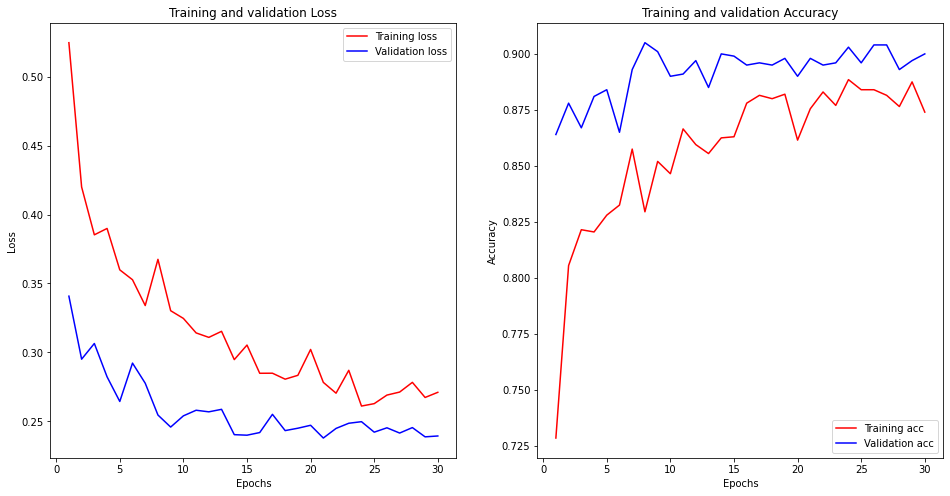

In [ ]:
fig, axes = plt.subplots(1, 2, squeeze = False, figsize = (16, 8))

# loss
train_loss_values = history_dict["loss"]
val_loss_values = history_dict["val_loss"]

# epochs
epochs = range(1, len(train_loss_values) + 1)

# accuracy
train_acc_values = history_dict["acc"]
val_acc_values = history_dict["val_acc"]

ax = axes.flat[0]
ax.plot(epochs, train_loss_values, "r", label = "Training loss")
ax.plot(epochs, val_loss_values, "b", label = "Validation loss")
ax.set_title("Training and validation Loss")
ax.set_xlabel("Epochs")
ax.set_ylabel("Loss")
ax.legend()

ax = axes.flat[1]
ax.plot(epochs, train_acc_values, "r", label = "Training acc")
ax.plot(epochs, val_acc_values, "b", label = "Validation acc")
ax.set_title("Training and validation Accuracy")
ax.set_xlabel("Epochs")
ax.set_ylabel("Accuracy")
ax.legend()

### Métricas de Avaliação do Modelo

O teste do modelo pode ser realizado a partir da função **evaluate**, que também suporta generators.

* Observe que dessa vez utilizou-se o parâmetro "shuffle" no flow_from_directory. Isso foi feito para que os exemplos de teste não fossem embaralhados pelo generator e pudessem ser identificados posteriormente.

In [ ]:
test_datagen   = ImageDataGenerator(rescale = 1. / 255)
test_generator = test_datagen.flow_from_directory( 
                   os.path.join(".", "data", "test"), target_size = (150, 150),
                   batch_size  = 1, class_mode  = "binary", shuffle = False)

# atributo do generator que fornece o número de amostras detectadas
test_samples = test_generator.samples

test_loss, test_acc = model.evaluate(test_generator)

print("Test Accuracy:", 100 * test_acc, "%")
print("Acertos: {} - Erros: {}".format(round(test_samples * test_acc), 
                                       round(test_samples * (1 - test_acc))))

Found 1000 images belonging to 2 classes.
1000/1000 [==============================] - 8s 7ms/step - loss: 0.2670 - acc: 0.8750
Test Accuracy: 87.5 %
Acertos: 875 - Erros: 125


### Visualização dos Resultados

In [ ]:
def show_results(paths, ytest, ypred, labels, num = 25, tipo = "rand"):
    
    if tipo == "acertos":
        fltr_idx = [i for i in range(ytest.shape[0]) if ypred[i] == ytest[i]]
    else:
        fltr_idx = [i for i in range(ytest.shape[0]) if ypred[i] != ytest[i]]
        
    indices = np.random.choice(fltr_idx, min(num, len(fltr_idx)), replace=False)
       
    rows = int(num/5)
    fig, axs = plt.subplots(nrows = rows, ncols = 5, figsize=(20, 5*rows))
    
    for i, idx in enumerate(indices):
        path = os.path.join(".", "data", "test", paths[idx])
        img = cv2.imread(path)[:,:,::-1]
        if ypred[idx] == ytest[idx]:
            axs[i//5][i%5].set_title(labels[ytest[idx]], color = "green", fontsize = 20)
        else:
            axs[i//5][i%5].set_title("Pred: {}\n Gabarito: {}".format(labels[ypred[idx]], 
                                                                      labels[ytest[idx]]), 
                                     color = "red", fontsize = 20)
        
        axs[i//5][i%5].imshow(img, vmin = 0, vmax = 255, cmap = "gray")
        axs[i//5][i%5].axis('off')
    return

test_generator.reset()
filenames = test_generator.filenames
labels = test_generator.labels

pred_labels = model.predict(test_generator, verbose = 1)
preds = [int(pred[0] > 0.5) for pred in pred_labels]

1000/1000 [==============================] - 6s 6ms/step


### Imagens Preditas Corretamente

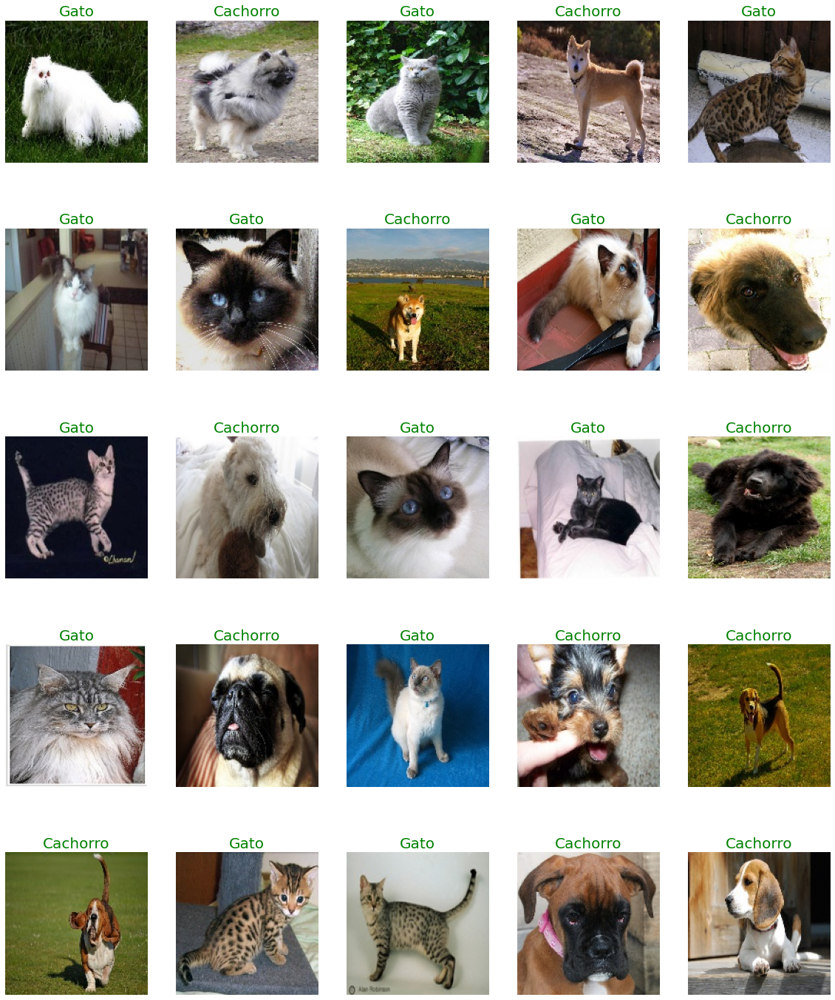

In [ ]:
show_results(filenames, labels, preds, idx_to_class_dict, tipo = "acertos")

### Imagens Preditas Erroneamente

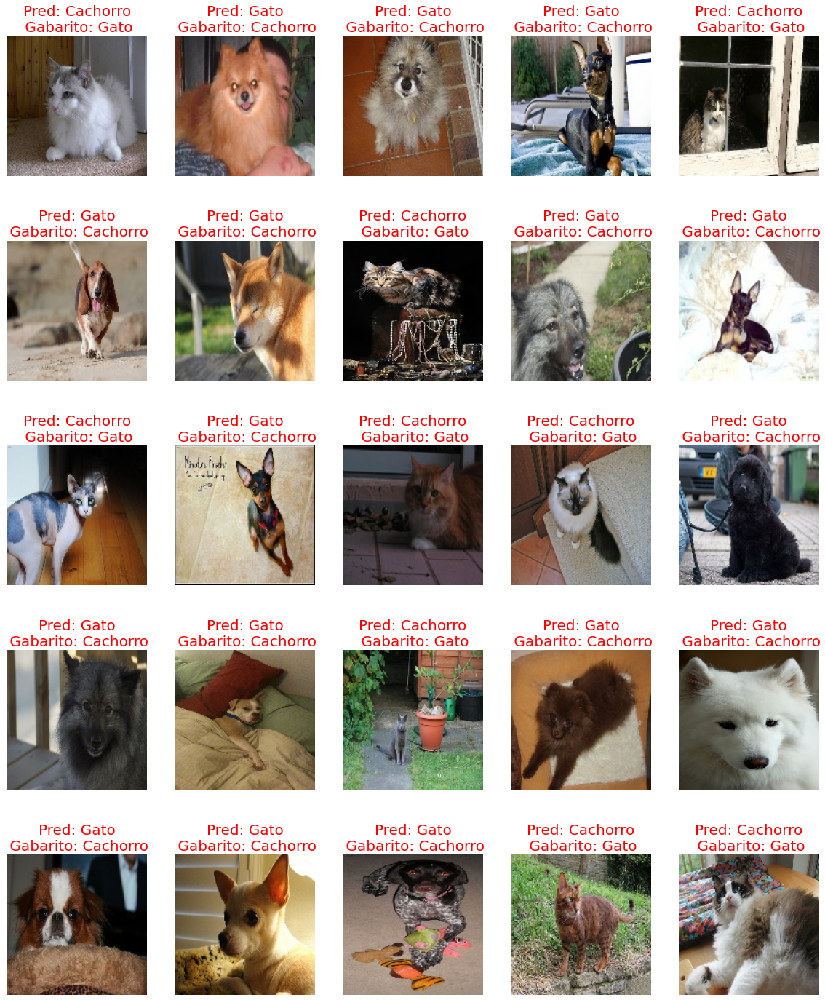

In [ ]:
show_results(filenames, labels, preds, idx_to_class_dict, tipo = "erros")

* As imagens em que a rede errou na predição possuem dois aspectos interessantes:
    * A foto dos gatos tendem a ter características muito próximas dos cachorros (i.e rabo, orelha, nariz e pelugem) e vice-versa, o que acaba confundindo o modelo na hora de realizar a predição.
    * A imagem de fundo tende a ter muitos elementos ou ser mais predominante do que a área que contém o animal, influenciado de modo indireto em uma classificação errônea.

### Inicialização com Pesos Aleatórios (Congelamento de Camadas)

In [ ]:
def build_model( input_shape, n_outputs ):
  
    # Base convolucional
    conv_base = VGG16(include_top = False, weights = None, 
                      input_shape = input_shape)
    conv_base.trainable = False
    
    rede = Sequential()
    rede.add(conv_base)
    rede.add(layers.Flatten())
    rede.add(layers.Dense(256, activation = "relu"))
    rede.add(layers.Dense(1, activation = "sigmoid"))
    
    return rede

model = build_model((150, 150, 3), 1)
model.compile(optimizer = optimizers.Adam(learning_rate = 1e-4), 
              loss = "binary_crossentropy", 
              metrics = ["acc"])
model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 4, 4, 512)         14714688  
                                                                 
 flatten_3 (Flatten)         (None, 8192)              0         
                                                                 
 dense_6 (Dense)             (None, 256)               2097408   
                                                                 
 dense_7 (Dense)             (None, 1)                 257       
                                                                 
Total params: 16,812,353
Trainable params: 2,097,665
Non-trainable params: 14,714,688
_________________________________________________________________


### Inicialização com Pesos Aleatórios (Callbacks)

In [ ]:
model_checkpoint = callbacks.ModelCheckpoint("model.h5", monitor = "val_acc", 
                                             save_best_only = True, verbose = 1)
reduce_lr_on_plateau = callbacks.ReduceLROnPlateau(monitor = "val_acc", factor = 0.75, 
                                                   patience = 3, verbose = 1)

# repare que ao utilizar mais de 1 callback elas devem ser organizadas em uma lista
callback_list = [model_checkpoint, reduce_lr_on_plateau]

### Inicialização com Pesos Aleatórios (Treinando o Modelo)

In [ ]:
history = model.fit(train_generator, steps_per_epoch = 100,
                    epochs = 30, callbacks = callback_list, 
                    validation_data = val_generator, validation_steps = 50)

model.load_weights("model.h5")

history_dict = history.history

Epoch 1/30
100/100 [==============================] - ETA: 0s - loss: 0.6933 - acc: 0.4905
Epoch 1: val_acc improved from -inf to 0.51800, saving model to model.h5
100/100 [==============================] - 15s 143ms/step - loss: 0.6933 - acc: 0.4905 - val_loss: 0.6930 - val_acc: 0.5180 - lr: 1.0000e-04
Epoch 2/30
100/100 [==============================] - ETA: 0s - loss: 0.6931 - acc: 0.5005
Epoch 2: val_acc did not improve from 0.51800
100/100 [==============================] - 14s 138ms/step - loss: 0.6931 - acc: 0.5005 - val_loss: 0.6927 - val_acc: 0.5000 - lr: 1.0000e-04
Epoch 3/30
100/100 [==============================] - ETA: 0s - loss: 0.6931 - acc: 0.4985
Epoch 3: val_acc did not improve from 0.51800
100/100 [==============================] - 14s 141ms/step - loss: 0.6931 - acc: 0.4985 - val_loss: 0.6927 - val_acc: 0.5000 - lr: 1.0000e-04
Epoch 4/30
100/100 [==============================] - ETA: 0s - loss: 0.6931 - acc: 0.5000
Epoch 4: val_acc did not improve from 0.51800

E

### Inicialização com Pesos Aleatórios (Resultados do Treinamento)

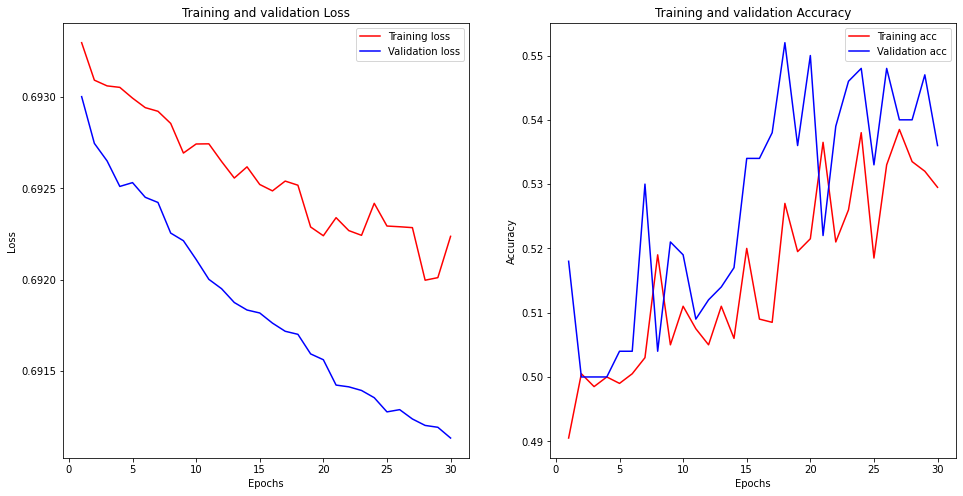

In [ ]:
fig, axes = plt.subplots(1, 2, squeeze = False, figsize = (16, 8))

# loss
train_loss_values = history_dict["loss"]
val_loss_values = history_dict["val_loss"]

# epochs
epochs = range(1, len(train_loss_values) + 1)

# accuracy
train_acc_values = history_dict["acc"]
val_acc_values = history_dict["val_acc"]

ax = axes.flat[0]
ax.plot(epochs, train_loss_values, "r", label = "Training loss")
ax.plot(epochs, val_loss_values, "b", label = "Validation loss")
ax.set_title("Training and validation Loss")
ax.set_xlabel("Epochs")
ax.set_ylabel("Loss")
ax.legend()

ax = axes.flat[1]
ax.plot(epochs, train_acc_values, "r", label = "Training acc")
ax.plot(epochs, val_acc_values, "b", label = "Validation acc")
ax.set_title("Training and validation Accuracy")
ax.set_xlabel("Epochs")
ax.set_ylabel("Accuracy")
ax.legend()

In [ ]:
test_datagen   = ImageDataGenerator(rescale = 1./255)
test_generator = test_datagen.flow_from_directory( 
                   os.path.join(".", "data", "test"), target_size = (150, 150),
                   batch_size  = 1, class_mode  = "binary", shuffle = False)

# atributo do generator que fornece o número de amostras detectadas
test_samples = test_generator.samples

test_loss, test_acc = model.evaluate( test_generator )

print("Test Accuracy:", 100 * test_acc, "%")
print("Acertos: {} - Erros: {}".format(round(test_samples * test_acc), 
                                       round(test_samples * (1 - test_acc))))

Found 1000 images belonging to 2 classes.
1000/1000 [==============================] - 7s 7ms/step - loss: 0.6920 - acc: 0.5390
Test Accuracy: 53.89999747276306 %
Acertos: 539 - Erros: 461


### Inicialização com Pesos Aleatórios (Visualização dos Resultados)

In [ ]:
def show_results(paths, ytest, ypred, labels, num = 25, tipo = "rand"):
    
    if tipo == "acertos":
        fltr_idx = [i for i in range(ytest.shape[0]) if ypred[i] == ytest[i]]
    else:
        fltr_idx = [i for i in range(ytest.shape[0]) if ypred[i] != ytest[i]]
        
    indices = np.random.choice(fltr_idx, min(num, len(fltr_idx)), replace=False)
       
    rows = int(num/5)
    fig, axs = plt.subplots(nrows = rows, ncols = 5, figsize = (20, 5 * rows))
    
    for i, idx in enumerate(indices):
        path = os.path.join(".", "data", "test", paths[idx])
        img = cv2.imread(path)[:,:,::-1]
        if ypred[idx] == ytest[idx]:
            axs[i//5][i%5].set_title(labels[ytest[idx]], color = "green", fontsize = 20)
        else:
            axs[i//5][i%5].set_title("Pred: {}\n Gabarito: {}".format(labels[ypred[idx]], 
                                                                      labels[ytest[idx]]), 
                                     color = "red", fontsize = 20)
        
        axs[i//5][i%5].imshow(img, vmin = 0, vmax = 255, cmap = "gray")
        axs[i//5][i%5].axis('off')
    return

test_generator.reset()
filenames = test_generator.filenames
labels = test_generator.labels

pred_labels = model.predict(test_generator, verbose = 1)
preds = [int(pred[0] > 0.5) for pred in pred_labels]

1000/1000 [==============================] - 7s 6ms/step


### Inicialização com Pesos Aleatórios (Imagens Preditas Corretamente)

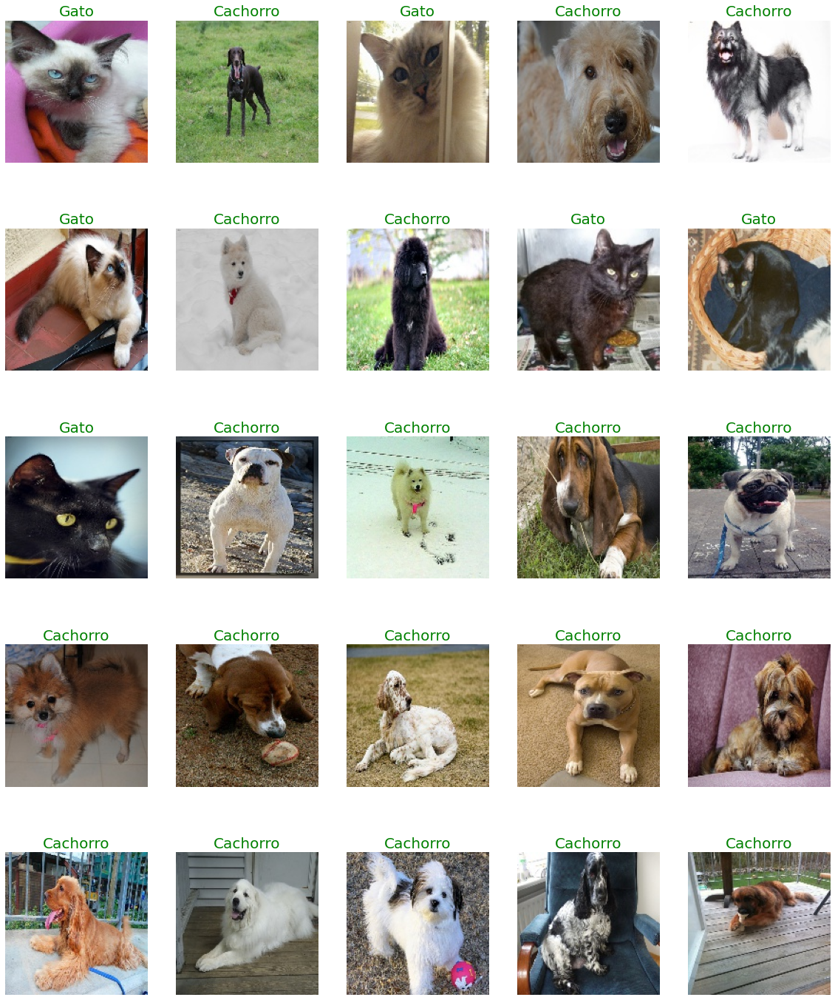

In [ ]:
show_results(filenames, labels, preds, idx_to_class_dict, tipo = "acertos")

### Inicialização com Pesos Aleatórios (Imagens Preditas Erroneamente)

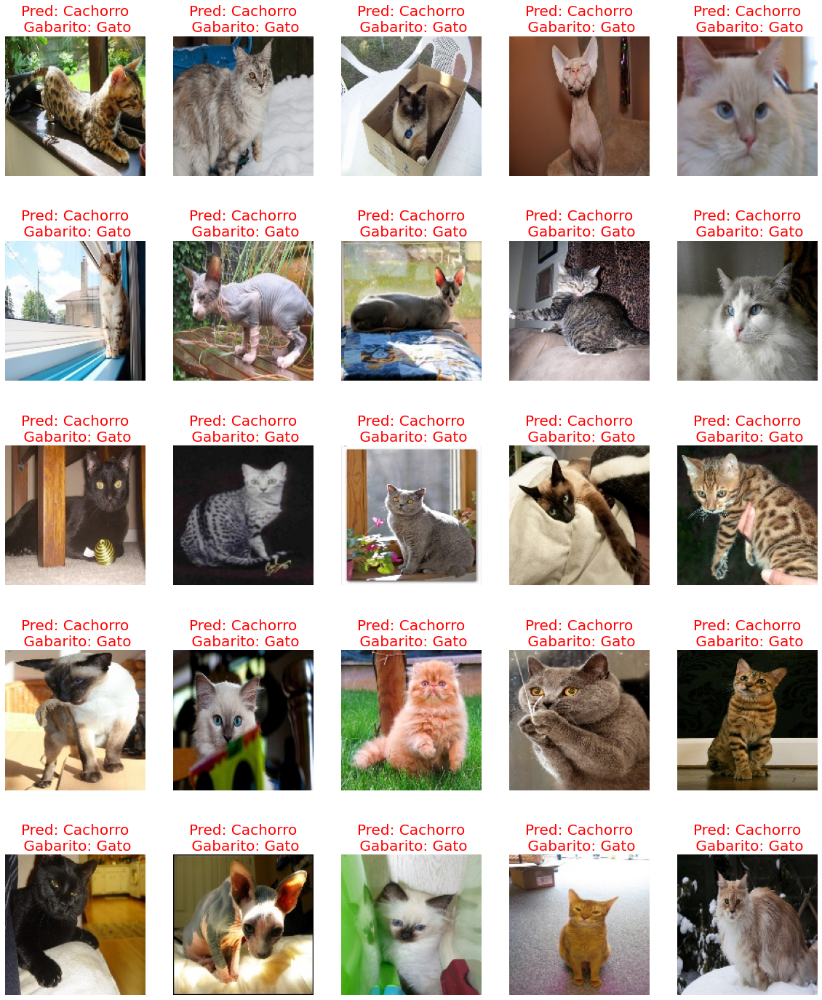

In [ ]:
show_results(filenames, labels, preds, idx_to_class_dict, tipo = "erros")

- A rede pré-treinada melhorou a qualidade do modelo produzido em comparação com uma inicialização de pesos com valores aleatórios.

***
![SecondarySpanishLacewing-max-1mb](https://user-images.githubusercontent.com/58775072/160296819-ead18896-8f81-4c85-a751-8755eeac3431.gif)